In [153]:
import torch

device = torch.device('mps')

print(device)

mps


In [154]:
import torch
import pandas as pd
import numpy as np
import ast

In [155]:
import torch
import torch.nn as nn
from transformers import BertTokenizer, BertModel

In [156]:
from gensim.models import Word2Vec, KeyedVectors
from gensim.models import KeyedVectors
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np
import gensim
import gensim.downloader


In [ ]:
import gensim
import gensim.downloader
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

word2vec_model = gensim.downloader.load('word2vec-google-news-300')


def sentence_embedding(sentence, model):
    """
    Generate sentence embedding by averaging the word embeddings.
    """
    word_embeddings = []
    for word in sentence.split():
        if word in model:
            word_embeddings.append(model[word])
    if len(word_embeddings) == 0:
        return np.zeros(model.vector_size)
    else:
        return np.mean(word_embeddings, axis=0)

def cosine_similarity_model(sentence1, sentence2, model):
    """
    Calculate cosine similarity between two sentences using GloVe embeddings.
    """
    embedding1 = sentence_embedding(sentence1, model)
    embedding2 = sentence_embedding(sentence2, model)
    if np.all(embedding1 == 0) or np.all(embedding2 == 0):
        return 0  # Return 0 similarity if any of the sentences has no valid embeddings
    else:
        return cosine_similarity([embedding1], [embedding2])[0][0]
    
# Example sentence
sentence = "The quick brown fox jumps over the lazy dog"

# This will give its embeddings
embedding_sentence = sentence_embedding(sentence, word2vec_model)
print(embedding_sentence)

# Example sentences
sentence1 = "The quick brown fox jumps over the lazy dog"
sentence2 = "the slow black cat dives under the active tiger"

# This will give the similarity score between two sentences
similarity_word2vec = cosine_similarity_model(sentence1, sentence2, word2vec_model)
print("Word2Vec Similarity: ", similarity_word2vec)

In [157]:
from transformers import AutoTokenizer, AutoModel
import torch

tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")
model = AutoModel.from_pretrained("bert-base-uncased")
model.to(device)

def get_sentence_embedding(sentence, tokenizer, model):
    
    # Tokenize input sentence
    inputs = tokenizer(sentence, return_tensors="pt", padding=True, truncation=True).to(device)
    
    # Pass input tokens through the model
    with torch.no_grad():
        outputs = model(**inputs)
    
    # Get the output of the [CLS] token (the first token)
    cls_embedding = outputs.last_hidden_state[:, 0, :]
    
    return cls_embedding

def cosine_similarity_bert(sentence1, sentence2, tokenizer, model):
    # Get embeddings for the sentences
    embedding1 = get_sentence_embedding(sentence1, tokenizer, model)
    embedding2 = get_sentence_embedding(sentence2, tokenizer, model)

    # Calculate cosine similarity
    cosine_similarity_bert_value = torch.nn.functional.cosine_similarity(embedding1, embedding2, dim=1)
    return cosine_similarity_bert_value.item()

## Instead of running this, run the save embedding file below.
from openai import OpenAI
import concurrent.futures
client = OpenAI(api_key='sk-proj-rnvImRGIkwtlOigie9LHT3BlbkFJyvbASU5Iqj9yyPewC5bw')

def get_embedding(text, model="text-embedding-3-small"):
    text = text.replace("\n", " ")
    # if len(text) >= 8100:
    #     print("Huge")
    #     text = text[0:8100]
    return client.embeddings.create(input=[text], model=model).data[0].embedding

def get_embedding_wrapper(topic_name):
    return get_embedding(topic_name, model='text-embedding-3-small')

from sklearn.metrics.pairwise import cosine_similarity

#similarities = cosine_similarity([job_embedding], company_embeddings)[0]

def sentence_embedding(sentence, model):
    """
    Generate sentence embedding by averaging the word embeddings.
    """
    word_embeddings = []
    for word in sentence.split():
        if word in model:
            word_embeddings.append(model[word])
    if len(word_embeddings) == 0:
        return np.zeros(model.vector_size)
    else:
        return np.mean(word_embeddings, axis=0)

def cosine_similarity_model(sentence1, sentence2, model):
    """
    Calculate cosine similarity between two sentences using GloVe embeddings.
    """
    embedding1 = sentence_embedding(sentence1, model)
    embedding2 = sentence_embedding(sentence2, model)
    if np.all(embedding1 == 0) or np.all(embedding2 == 0):
        return 0  # Return 0 similarity if any of the sentences has no valid embeddings
    else:
        return cosine_similarity([embedding1], [embedding2])[0][0]


# Example sentences
sentence1 = "The quick brown fox jumps over the lazy dog"
sentence2 = "the slow black cat dives under the active tiger"

#glove_vectors = gensim.downloader.load('glove-twitter-200')
#word2vec_vectors = gensim.downloader.load('word2vec-google-news-300')

# Calculate cosine similarity using all models
#similarity_glove = cosine_similarity_model(sentence1, sentence2, glove_vectors)
#similarity_word2vec = cosine_similarity_model(sentence1, sentence2, word2vec_vectors)
similarity_openai = cosine_similarity([get_embedding(sentence1, model="text-embedding-3-small")], [get_embedding(sentence2, model="text-embedding-3-small")])[0][0]
#similarity_bert = cosine_similarity_bert(sentence1, sentence2, tokenizer, model)

#print("GloVe Similarity: ", similarity_glove)
#print("Word2Vec Similarity: ", similarity_word2vec)
print("OpenAI Embedding Similarity: ", similarity_openai)
#print("Bert Embedding Similarity: ", similarity_bert)


/Users/apple/anaconda3/envs/nurture/lib/python3.10/site-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


OpenAI Embedding Similarity:  0.47101105220341843


In [159]:
data = pd.read_csv("profile_post_similar_2.csv")

In [160]:
data.head()

,Unnamed: 0.2,Unnamed: 0.1,Unnamed: 0,LinkedIn_url,Posts_data,Glove_Similarities,Word2Vec_Similarities,Bert_Similarities,OpenAI_Similarities
0,0,0,0,http://www.linkedin.com/in/arpit-maheshwari-a8...,[[]],NaN,NaN,NaN,NaN
1,1,1,1,http://www.linkedin.com/in/aravindchandrasekar...,[[]],NaN,NaN,NaN,NaN
2,2,2,2,http://www.linkedin.com/in/sofia-pacifico-6ba5...,[[{'Article Subtitle': 'yale-som-execed.creden...,"[{'AI-driven Code Generation': 0, 'Automated C...","[{'AI-driven Code Generation': 0.28857827, 'Au...",[{'AI-driven Code Generation': 0.7910937070846...,NaN
3,3,3,3,http://www.linkedin.com/in/kbakshi,[[{'Article Subtitle': 'greatplacetowork.com •...,"[{'AI-driven Code Generation': 0, 'Automated C...","[{'AI-driven Code Generation': 0.22870633, 'Au...",[{'AI-driven Code Generation': 0.7599074244499...,NaN
4,4,4,4,http://www.linkedin.com/in/harry-tang-ab7462b,[[]],NaN,NaN,NaN,NaN


In [161]:
data.keys()

Index(['Unnamed: 0.2', 'Unnamed: 0.1', 'Unnamed: 0', 'LinkedIn_url',
       'Posts_data', 'Glove_Similarities', 'Word2Vec_Similarities',
       'Bert_Similarities', 'OpenAI_Similarities'],
      dtype='object')

In [13]:
import json

In [33]:
import ast

def parse_string_to_list_of_dicts(string_data):
    # Safely evaluate the string as a Python literal
    parsed_data = ast.literal_eval(string_data)
    return parsed_data

In [158]:
key_phrases = [
    "AI-driven Code Generation",
    "Automated Code Review",
    "AI-based Bug Fixing",
    "Natural Language to Code Translation",
    "Dynamic Software Customization",
    "AI-enhanced Test Case Generation",
    "Predictive Development Analytics",
    "AI-optimized Refactoring",
    "Generative Models for UI Design",
    "AI-driven Development Pipelines"
]

key_phrases_embeddings = []

for key_phrase in key_phrases:
    key_phrases_embeddings.append(get_embedding(key_phrase, model="text-embedding-3-small"))

In [21]:
empty_indices_list = []
for i in range(len(data)):
    if len(parse_string_to_list_of_dicts(data["Posts_data"][i])[0]) != 0:
        for j in range(len(parse_string_to_list_of_dicts(data["Posts_data"][i])[0])):
            sentence1 = parse_string_to_list_of_dicts(data["Posts_data"][i])[0][j]["Text"]
            if(len(sentence1) == 0):
                indices = {}
                indices["user"] = i
                indices["post_number"] = j
                #print(f"User : {i}, Post Number : {j}")
                empty_indices_list.append(indices)


In [23]:
empty_indices_list

[{'user': 2, 'post_number': 26},
 {'user': 3, 'post_number': 11},
 {'user': 3, 'post_number': 12},
 {'user': 3, 'post_number': 13},
 {'user': 3, 'post_number': 14},
 {'user': 3, 'post_number': 15},
 {'user': 3, 'post_number': 16},
 {'user': 3, 'post_number': 18},
 {'user': 3, 'post_number': 20},
 {'user': 3, 'post_number': 21},
 {'user': 6, 'post_number': 2},
 {'user': 6, 'post_number': 3},
 {'user': 6, 'post_number': 20},
 {'user': 10, 'post_number': 2},
 {'user': 11, 'post_number': 32},
 {'user': 12, 'post_number': 4},
 {'user': 12, 'post_number': 5},
 {'user': 12, 'post_number': 6},
 {'user': 12, 'post_number': 7},
 {'user': 12, 'post_number': 8},
 {'user': 12, 'post_number': 9},
 {'user': 13, 'post_number': 33},
 {'user': 16, 'post_number': 7},
 {'user': 20, 'post_number': 34},
 {'user': 24, 'post_number': 7},
 {'user': 28, 'post_number': 34},
 {'user': 39, 'post_number': 31},
 {'user': 39, 'post_number': 40},
 {'user': 43, 'post_number': 26},
 {'user': 43, 'post_number': 27},
 {'u

In [171]:
# sample_list = []
# for i in range(len(data)):
#     sample_list.append(None)
# data["Glove_Similarities"] = sample_list
# data["Word2Vec_Similarities"] = sample_list
# data["Bert_Similarities"] = sample_list
# data["OpenAI_Similarities"] = sample_list

for i in range(len(data)):
    if len(parse_string_to_list_of_dicts(data["Posts_data"][i])[0]) != 0:
        #print(f"i : {i}")
        #similarities_bert = []
        similarities_openai = []
        #similarities_glove = []
        #similarities_word2vec = []
        for j in range(len(parse_string_to_list_of_dicts(data["Posts_data"][i])[0])):
            #print(f"j : {j}")
            sentence1 = parse_string_to_list_of_dicts(data["Posts_data"][i])[0][j]["Text"]
            if(len(sentence1) != 0):
                openai_1 = [get_embedding(sentence1, model="text-embedding-3-small")]
                #similarity_bert = {}
                #similarity_glove = {}
                #similarity_word2vec = {}
                similarity_openai = {}
                for k in range(len(key_phrases)):
                    #similarity_word2vec[key_phrases[k]] = cosine_similarity_model(sentence1, key_phrases[k], word2vec_vectors)
                    #similarity_glove[key_phrases[k]] = cosine_similarity_model(sentence1, key_phrases[k], glove_vectors)
                    #similarity_bert[key_phrases[k]] = cosine_similarity_bert(sentence1, key_phrases[k], tokenizer, model)
                    similarity_openai[key_phrases[k]] = cosine_similarity(openai_1, [key_phrases_embeddings[k]])[0][0]


                #similarities_bert.append(similarity_bert)
                #similarities_glove.append(similarity_glove)
                #similarities_word2vec.append(similarity_word2vec)
                similarities_openai.append(similarity_openai)

        # Add new rows to the DataFrame
        #data["Bert_Similarities"][i] = similarities_bert
        #data["Glove_Similarities"][i] = similarities_glove
        #data["Word2Vec_Similarities"][i] = similarities_word2vec
        data["OpenAI_Similarities"][i] = similarities_openai

/var/folders/67/bhjq37955y5_sr34fd9gznsm0000gn/T/ipykernel_31842/3091546552.py:41: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  data["OpenAI_Similarities"][i] = similarities_openai
/var/folders/67/bhjq37955y5_sr34fd9gznsm0000gn/T/ipykernel_

In [5]:
data = pd.read_csv("profile_post_similar_3.csv")

In [6]:
data.keys()

Index(['Unnamed: 0.3', 'Unnamed: 0.2', 'Unnamed: 0.1', 'Unnamed: 0',
       'LinkedIn_url', 'Posts_data', 'Glove_Similarities',
       'Word2Vec_Similarities', 'Bert_Similarities', 'OpenAI_Similarities'],
      dtype='object')

In [7]:
ast.literal_eval(data["Glove_Similarities"][2])[0]

{'AI-driven Code Generation': 0,
 'Automated Code Review': 0,
 'AI-based Bug Fixing': 0,
 'Natural Language to Code Translation': 0.85783106,
 'Dynamic Software Customization': 0,
 'AI-enhanced Test Case Generation': 0,
 'Predictive Development Analytics': 0,
 'AI-optimized Refactoring': 0,
 'Generative Models for UI Design': 0.8370894,
 'AI-driven Development Pipelines': 0}

In [8]:
def evaluation_datapoint(data, column, row, post_number):
    datapoint = ast.literal_eval(data[column][row])[post_number]
    # Sort the dictionary items by value in descending order
    #sorted_data = sorted(datapoint.items(), key=lambda x: x[1], reverse=True)

    #print("Descending order of the dictionary:")
    # for key, value in sorted_data:
    #     print(f"{key}: {value}")

    # Find the key with the highest value
    max_key = max(datapoint, key=datapoint.get)
    max_value = datapoint[max_key]
    return max_key, max_value


In [9]:
similarity_keys = list(data.keys())[-4:]

In [10]:
best_match, best_match_similarity = evaluation_datapoint(data, similarity_keys[3], 2, 3)
best_match_similarity

0.2597399885592986

In [19]:
len(parse_string_to_list_of_dicts(data[similarity_keys[3]][i]))

38

In [15]:
sample_list = []
for i in range(len(data)):
    sample_list.append(None)
data["OpenAI_Best_Match"] = sample_list
data["OpenAI_Best_Match_Similarity"] = sample_list

for i in range(len(data)):
    if len(parse_string_to_list_of_dicts(data["Posts_data"][i])[0]) != 0:
        best_matches_of_user = []
        best_matches_similarity_of_user = []

        for post_number in range(len(parse_string_to_list_of_dicts(data["Posts_data"][i])[0])):
            print(post_number)
            best_match, best_match_similarity = evaluation_datapoint(data, similarity_keys[3], i, post_number)
            best_matches_of_user.append(best_match)
            best_matches_similarity_of_user.append(best_match_similarity)

        data["OpenAI_Best_Match"][i] = best_matches_of_user
        data["OpenAI_Best_Match_Similarity"][i] = best_matches_similarity_of_user


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38


IndexError: list index out of range

In [190]:
def post_text(data, user, post_number):
    return (parse_string_to_list_of_dicts(data["Posts_data"][user])[0][post_number]["Text"])

In [191]:
print(post_text(data, 2, 3))

Do you wish to expand your professional network, accelerate development, gain confidence and grow personally and professionally? Join this VIRTUAL SPEED MENTORING event -> https://lnkd.in/g4sk2VEJ #cisco #wise #mentoring #network


In [25]:
data = pd.read_csv("profile_post_similar_3.csv")
data.keys()

Index(['Unnamed: 0.3', 'Unnamed: 0.2', 'Unnamed: 0.1', 'Unnamed: 0',
       'LinkedIn_url', 'Posts_data', 'Glove_Similarities',
       'Word2Vec_Similarities', 'Bert_Similarities', 'OpenAI_Similarities'],
      dtype='object')

In [26]:
# Assuming 'data' is your DataFrame
data = data.drop([col for col in data.columns if 'Unnamed' in col], axis=1)

# Now 'data' DataFrame will not have the unnamed columns


In [30]:
cols = list(data.keys())
cols[1] = 'Post_text'
cols

['LinkedIn_url',
 'Post_text',
 'Glove_Similarities',
 'Word2Vec_Similarities',
 'Bert_Similarities',
 'OpenAI_Similarities']

In [31]:
df = pd.DataFrame(columns=cols)

In [35]:
rows = []
for i in range(len(data)):
    if len(parse_string_to_list_of_dicts(data["Posts_data"][i])[0]) != 0:
        k = 0
        for j in range(len(parse_string_to_list_of_dicts(data["Posts_data"][i])[0])):
            text = parse_string_to_list_of_dicts(data["Posts_data"][i])[0][j]["Text"]
            # row = { cols[0] : data[cols[0]][i],
            #         cols[1] : text,
            #         cols
            #     }

            if(len(text) != 0):
                row = { cols[0] : data[cols[0]][i],
                    cols[1] : text,
                    cols[2] : ast.literal_eval(data[cols[2]][i])[k],
                    cols[3] : ast.literal_eval(data[cols[3]][i])[k],
                    cols[4] : ast.literal_eval(data[cols[4]][i])[k],
                    cols[5] : ast.literal_eval(data[cols[5]][i])[k]
                }
                k += 1
                rows.append(row)

In [37]:
new_df = pd.DataFrame(rows)

In [43]:
new_df.to_csv("profile_post_similar_4.csv", index=False)

In [44]:
data = pd.read_csv("profile_post_similar_4.csv")

In [45]:
data

,LinkedIn_url,Post_text,Glove_Similarities,Word2Vec_Similarities,Bert_Similarities,OpenAI_Similarities
0,http://www.linkedin.com/in/sofia-pacifico-6ba5...,I’m happy to share that I’ve obtained a new ce...,"{'AI-driven Code Generation': 0, 'Automated Co...","{'AI-driven Code Generation': 0.28857827, 'Aut...",{'AI-driven Code Generation': 0.79109370708465...,{'AI-driven Code Generation': 0.08124560534691...
1,http://www.linkedin.com/in/sofia-pacifico-6ba5...,I am thrilled to announce that I will be joini...,"{'AI-driven Code Generation': 0, 'Automated Co...","{'AI-driven Code Generation': 0.20768699, 'Aut...",{'AI-driven Code Generation': 0.66976511478424...,{'AI-driven Code Generation': 0.07756372812769...
2,http://www.linkedin.com/in/sofia-pacifico-6ba5...,Estoy emocionada de compartir que seré una de ...,"{'AI-driven Code Generation': 0, 'Automated Co...","{'AI-driven Code Generation': 0.13611442, 'Aut...",{'AI-driven Code Generation': 0.68347299098968...,{'AI-driven Code Generation': 0.12116106687265...
3,http://www.linkedin.com/in/sofia-pacifico-6ba5...,Do you wish to expand your professional networ...,"{'AI-driven Code Generation': 0, 'Automated Co...","{'AI-driven Code Generation': 0.113601044, 'Au...",{'AI-driven Code Generation': 0.78650254011154...,{'AI-driven Code Generation': 0.18334330174710...
4,http://www.linkedin.com/in/sofia-pacifico-6ba5...,I am happy to announce that I have officially ...,"{'AI-driven Code Generation': 0, 'Automated Co...","{'AI-driven Code Generation': 0.18561783, 'Aut...",{'AI-driven Code Generation': 0.78358221054077...,{'AI-driven Code Generation': 0.08440019976282...
...,...,...,...,...,...,...
981,http://www.linkedin.com/in/pulkits03,"Here in Dell Technologies Global Alliances, we...","{'AI-driven Code Generation': 0, 'Automated Co...","{'AI-driven Code Generation': 0.1868945, 'Auto...",{'AI-driven Code Generation': 0.68434178829193...,{'AI-driven Code Generation': 0.14558072865258...
982,http://www.linkedin.com/in/pulkits03,Dell technologies Global Alliances Heroes part...,"{'AI-driven Code Generation': 0, 'Automated Co...","{'AI-driven Code Generation': 0.26776534, 'Aut...",{'AI-driven Code Generation': 0.75137186050415...,{'AI-driven Code Generation': 0.12071473791775...
983,http://www.linkedin.com/in/pulkits03,"""Now Is the Time To Be A Global Alliances Part...","{'AI-driven Code Generation': 0, 'Automated Co...","{'AI-driven Code Generation': 0.28421926, 'Aut...",{'AI-driven Code Generation': 0.69131219387054...,{'AI-driven Code Generation': 0.12197071995437...
984,http://www.linkedin.com/in/pulkits03,"Did you know? Last fall, Dell Boomi added 20 t...","{'AI-driven Code Generation': 0, 'Automated Co...","{'AI-driven Code Generation': 0.20183983, 'Aut...",{'AI-driven Code Generation': 0.79895925521850...,{'AI-driven Code Generation': 0.23382413758641...


In [173]:
cols = list(data.keys())
cols

['LinkedIn_url',
 'Post_text',
 'Glove_Similarities',
 'Word2Vec_Similarities',
 'Bert_Similarities',
 'OpenAI_Similarities',
 'OpenAI_Best_Match',
 'OpenAI_Best_Match_Similarity',
 'Threshold : 0.2',
 'Threshold : 0.225',
 'Threshold : 0.25',
 'Threshold : 0.275',
 'Threshold : 0.3',
 'Threshold : 0.325']

In [ ]:
def evaluation_datapoint(data, column, row, post_number):
    datapoint = ast.literal_eval(data[column][row])[post_number]
    # Sort the dictionary items by value in descending order
    #sorted_data = sorted(datapoint.items(), key=lambda x: x[1], reverse=True)

    #print("Descending order of the dictionary:")
    # for key, value in sorted_data:
    #     print(f"{key}: {value}")

    # Find the key with the highest value
    max_key = max(datapoint, key=datapoint.get)
    max_value = datapoint[max_key]
    return max_key, max_value


In [174]:
sample_list = []
for i in range(len(data)):
    sample_list.append(None)
data["Bert_Best_Match"] = sample_list
data["Bert_Best_Match_Similarity"] = sample_list

for i in range(len(data)):
    datapoint = ast.literal_eval(data[cols[4]][i])
    
    max_key = max(datapoint, key=datapoint.get)
    data["Bert_Best_Match"][i] = max_key
    data["Bert_Best_Match_Similarity"][i] = datapoint[max_key]

/var/folders/67/bhjq37955y5_sr34fd9gznsm0000gn/T/ipykernel_3952/1290232408.py:11: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  data["Bert_Best_Match"][i] = max_key
/var/folders/67/bhjq37955y5_sr34fd9gznsm0000gn/T/ipykernel_3952/1290232408.p

In [176]:
data.to_csv("profile_post_similar_7.csv", index=False)

In [118]:
data = pd.read_csv("profile_post_similar_5.csv")
data

,LinkedIn_url,Post_text,Glove_Similarities,Word2Vec_Similarities,Bert_Similarities,OpenAI_Similarities,OpenAI_Best_Match,OpenAI_Best_Match_Similarity
0,http://www.linkedin.com/in/sofia-pacifico-6ba5...,I’m happy to share that I’ve obtained a new ce...,"{'AI-driven Code Generation': 0, 'Automated Co...","{'AI-driven Code Generation': 0.28857827, 'Aut...",{'AI-driven Code Generation': 0.79109370708465...,{'AI-driven Code Generation': 0.08124560534691...,Predictive Development Analytics,0.150225
1,http://www.linkedin.com/in/sofia-pacifico-6ba5...,I am thrilled to announce that I will be joini...,"{'AI-driven Code Generation': 0, 'Automated Co...","{'AI-driven Code Generation': 0.20768699, 'Aut...",{'AI-driven Code Generation': 0.66976511478424...,{'AI-driven Code Generation': 0.07756372812769...,Predictive Development Analytics,0.188517
2,http://www.linkedin.com/in/sofia-pacifico-6ba5...,Estoy emocionada de compartir que seré una de ...,"{'AI-driven Code Generation': 0, 'Automated Co...","{'AI-driven Code Generation': 0.13611442, 'Aut...",{'AI-driven Code Generation': 0.68347299098968...,{'AI-driven Code Generation': 0.12116106687265...,AI-driven Development Pipelines,0.175292
3,http://www.linkedin.com/in/sofia-pacifico-6ba5...,Do you wish to expand your professional networ...,"{'AI-driven Code Generation': 0, 'Automated Co...","{'AI-driven Code Generation': 0.113601044, 'Au...",{'AI-driven Code Generation': 0.78650254011154...,{'AI-driven Code Generation': 0.18334330174710...,AI-driven Development Pipelines,0.259740
4,http://www.linkedin.com/in/sofia-pacifico-6ba5...,I am happy to announce that I have officially ...,"{'AI-driven Code Generation': 0, 'Automated Co...","{'AI-driven Code Generation': 0.18561783, 'Aut...",{'AI-driven Code Generation': 0.78358221054077...,{'AI-driven Code Generation': 0.08440019976282...,AI-optimized Refactoring,0.154180
...,...,...,...,...,...,...,...,...
981,http://www.linkedin.com/in/pulkits03,"Here in Dell Technologies Global Alliances, we...","{'AI-driven Code Generation': 0, 'Automated Co...","{'AI-driven Code Generation': 0.1868945, 'Auto...",{'AI-driven Code Generation': 0.68434178829193...,{'AI-driven Code Generation': 0.14558072865258...,AI-driven Development Pipelines,0.247264
982,http://www.linkedin.com/in/pulkits03,Dell technologies Global Alliances Heroes part...,"{'AI-driven Code Generation': 0, 'Automated Co...","{'AI-driven Code Generation': 0.26776534, 'Aut...",{'AI-driven Code Generation': 0.75137186050415...,{'AI-driven Code Generation': 0.12071473791775...,Dynamic Software Customization,0.228527
983,http://www.linkedin.com/in/pulkits03,"""Now Is the Time To Be A Global Alliances Part...","{'AI-driven Code Generation': 0, 'Automated Co...","{'AI-driven Code Generation': 0.28421926, 'Aut...",{'AI-driven Code Generation': 0.69131219387054...,{'AI-driven Code Generation': 0.12197071995437...,Dynamic Software Customization,0.231618
984,http://www.linkedin.com/in/pulkits03,"Did you know? Last fall, Dell Boomi added 20 t...","{'AI-driven Code Generation': 0, 'Automated Co...","{'AI-driven Code Generation': 0.20183983, 'Aut...",{'AI-driven Code Generation': 0.79895925521850...,{'AI-driven Code Generation': 0.23382413758641...,Predictive Development Analytics,0.326406


In [61]:
thresholds = [0.2, 0.225, 0.25, 0.275, 0.3, 0.325]

In [65]:
type(data["OpenAI_Best_Match_Similarity"][1])

numpy.float64

In [121]:
for threshold in thresholds:
    sample_list = []
    for i in range(len(data)):
        sample_list.append(None)
    attribute_name = f"Threshold : {threshold}"
    data[attribute_name] = sample_list
    for i in range(len(data)):
        if data["OpenAI_Best_Match_Similarity"][i] >= threshold:
            data[attribute_name][i] = True
        else:
            data[attribute_name][i] = False

/var/folders/67/bhjq37955y5_sr34fd9gznsm0000gn/T/ipykernel_3952/3589259877.py:11: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  data[attribute_name][i] = False
/var/folders/67/bhjq37955y5_sr34fd9gznsm0000gn/T/ipykernel_3952/3589259877.py:11:

In [122]:
data.keys()

Index(['LinkedIn_url', 'Post_text', 'Glove_Similarities',
       'Word2Vec_Similarities', 'Bert_Similarities', 'OpenAI_Similarities',
       'OpenAI_Best_Match', 'OpenAI_Best_Match_Similarity', 'Threshold : 0.2',
       'Threshold : 0.225', 'Threshold : 0.25', 'Threshold : 0.275',
       'Threshold : 0.3', 'Threshold : 0.325'],
      dtype='object')

In [124]:
data.to_csv("profile_post_similar_6.csv", index=False)

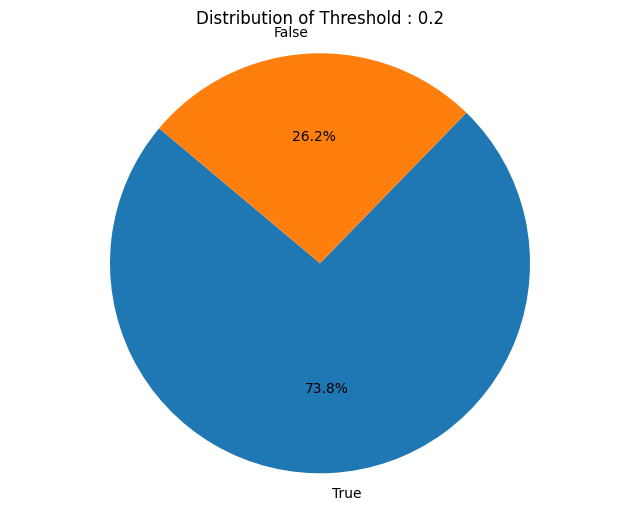

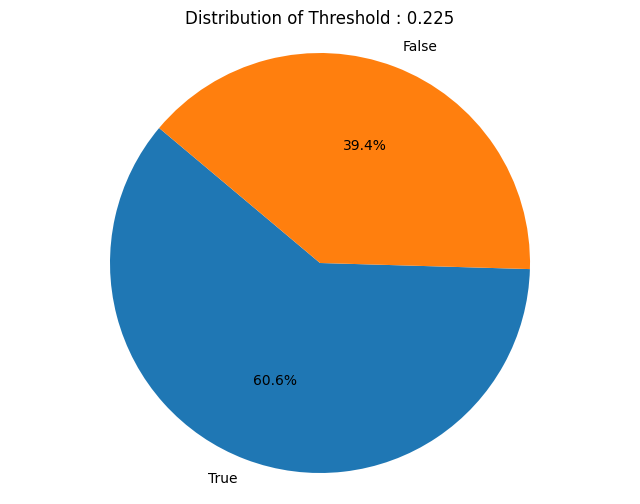

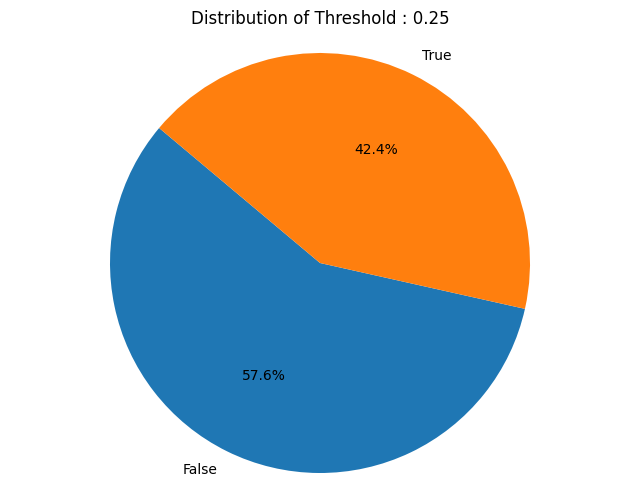

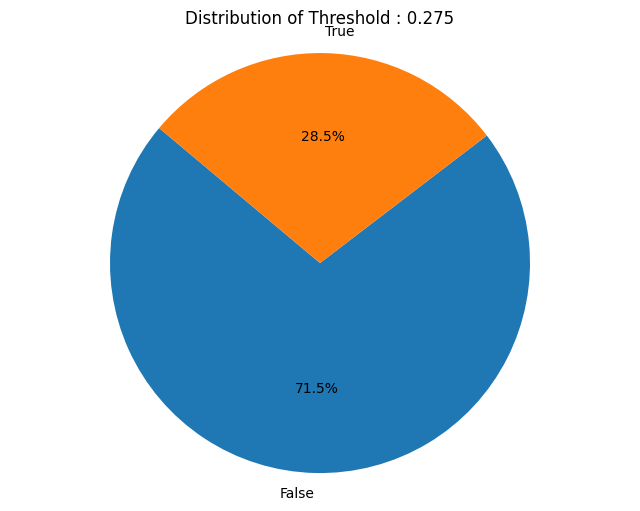

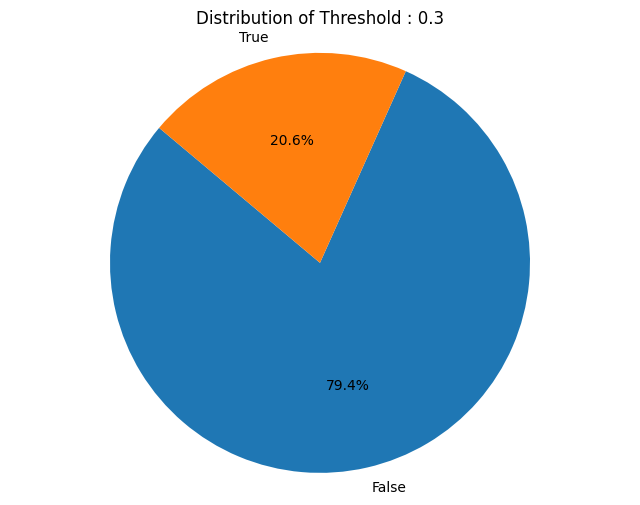

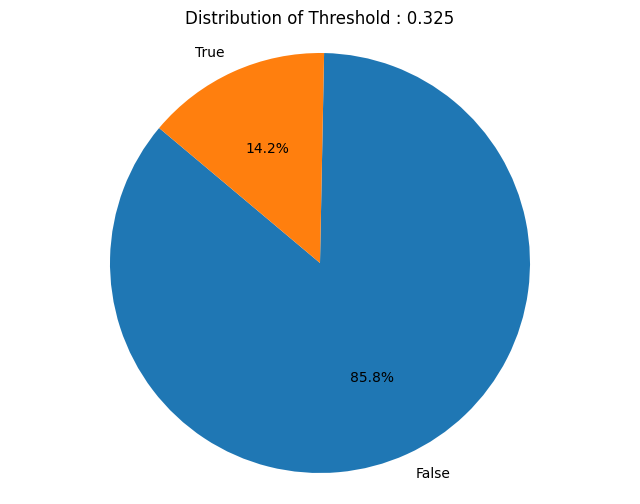

In [70]:
import matplotlib.pyplot as plt

# Define colors for True and False
colors = ['#1f77b4', '#ff7f0e']  # Blue and orange colors

# Threshold columns
threshold_columns = ['Threshold : 0.2', 'Threshold : 0.225', 'Threshold : 0.25', 
                     'Threshold : 0.275', 'Threshold : 0.3', 'Threshold : 0.325']

# Loop through each threshold column
for column in threshold_columns:
    # Calculate value counts
    value_counts = data[column].value_counts()
    
    # Plot pie chart with custom colors
    plt.figure(figsize=(8, 6))
    plt.pie(value_counts, labels=value_counts.index, autopct='%1.1f%%', startangle=140, colors=colors)
    plt.title(f'Distribution of {column}')
    plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
    plt.show()


In [119]:
data

,LinkedIn_url,Post_text,Glove_Similarities,Word2Vec_Similarities,Bert_Similarities,OpenAI_Similarities,OpenAI_Best_Match,OpenAI_Best_Match_Similarity
0,http://www.linkedin.com/in/sofia-pacifico-6ba5...,I’m happy to share that I’ve obtained a new ce...,"{'AI-driven Code Generation': 0, 'Automated Co...","{'AI-driven Code Generation': 0.28857827, 'Aut...",{'AI-driven Code Generation': 0.79109370708465...,{'AI-driven Code Generation': 0.08124560534691...,Predictive Development Analytics,0.150225
1,http://www.linkedin.com/in/sofia-pacifico-6ba5...,I am thrilled to announce that I will be joini...,"{'AI-driven Code Generation': 0, 'Automated Co...","{'AI-driven Code Generation': 0.20768699, 'Aut...",{'AI-driven Code Generation': 0.66976511478424...,{'AI-driven Code Generation': 0.07756372812769...,Predictive Development Analytics,0.188517
2,http://www.linkedin.com/in/sofia-pacifico-6ba5...,Estoy emocionada de compartir que seré una de ...,"{'AI-driven Code Generation': 0, 'Automated Co...","{'AI-driven Code Generation': 0.13611442, 'Aut...",{'AI-driven Code Generation': 0.68347299098968...,{'AI-driven Code Generation': 0.12116106687265...,AI-driven Development Pipelines,0.175292
3,http://www.linkedin.com/in/sofia-pacifico-6ba5...,Do you wish to expand your professional networ...,"{'AI-driven Code Generation': 0, 'Automated Co...","{'AI-driven Code Generation': 0.113601044, 'Au...",{'AI-driven Code Generation': 0.78650254011154...,{'AI-driven Code Generation': 0.18334330174710...,AI-driven Development Pipelines,0.259740
4,http://www.linkedin.com/in/sofia-pacifico-6ba5...,I am happy to announce that I have officially ...,"{'AI-driven Code Generation': 0, 'Automated Co...","{'AI-driven Code Generation': 0.18561783, 'Aut...",{'AI-driven Code Generation': 0.78358221054077...,{'AI-driven Code Generation': 0.08440019976282...,AI-optimized Refactoring,0.154180
...,...,...,...,...,...,...,...,...
981,http://www.linkedin.com/in/pulkits03,"Here in Dell Technologies Global Alliances, we...","{'AI-driven Code Generation': 0, 'Automated Co...","{'AI-driven Code Generation': 0.1868945, 'Auto...",{'AI-driven Code Generation': 0.68434178829193...,{'AI-driven Code Generation': 0.14558072865258...,AI-driven Development Pipelines,0.247264
982,http://www.linkedin.com/in/pulkits03,Dell technologies Global Alliances Heroes part...,"{'AI-driven Code Generation': 0, 'Automated Co...","{'AI-driven Code Generation': 0.26776534, 'Aut...",{'AI-driven Code Generation': 0.75137186050415...,{'AI-driven Code Generation': 0.12071473791775...,Dynamic Software Customization,0.228527
983,http://www.linkedin.com/in/pulkits03,"""Now Is the Time To Be A Global Alliances Part...","{'AI-driven Code Generation': 0, 'Automated Co...","{'AI-driven Code Generation': 0.28421926, 'Aut...",{'AI-driven Code Generation': 0.69131219387054...,{'AI-driven Code Generation': 0.12197071995437...,Dynamic Software Customization,0.231618
984,http://www.linkedin.com/in/pulkits03,"Did you know? Last fall, Dell Boomi added 20 t...","{'AI-driven Code Generation': 0, 'Automated Co...","{'AI-driven Code Generation': 0.20183983, 'Aut...",{'AI-driven Code Generation': 0.79895925521850...,{'AI-driven Code Generation': 0.23382413758641...,Predictive Development Analytics,0.326406


In [148]:
for i, r in data.iterrows():
    r['OpenAI_Best_Match']
    r['Post_text']
    

Index(['LinkedIn_url', 'Post_text', 'Glove_Similarities',
       'Word2Vec_Similarities', 'Bert_Similarities', 'OpenAI_Similarities',
       'OpenAI_Best_Match', 'OpenAI_Best_Match_Similarity', 'Threshold : 0.2',
       'Threshold : 0.225', 'Threshold : 0.25', 'Threshold : 0.275',
       'Threshold : 0.3', 'Threshold : 0.325'],
      dtype='object')

Value Counts:
OpenAI_Best_Match
AI-driven Development Pipelines         433
Dynamic Software Customization          170
AI-optimized Refactoring                118
Predictive Development Analytics         94
Automated Code Review                    63
AI-driven Code Generation                42
AI-based Bug Fixing                      38
AI-enhanced Test Case Generation         18
Natural Language to Code Translation      5
Generative Models for UI Design           5
Name: count, dtype: int64

Descriptive Statistics:
count                                 986
unique                                 10
top       AI-driven Development Pipelines
freq                                  433
Name: OpenAI_Best_Match, dtype: object



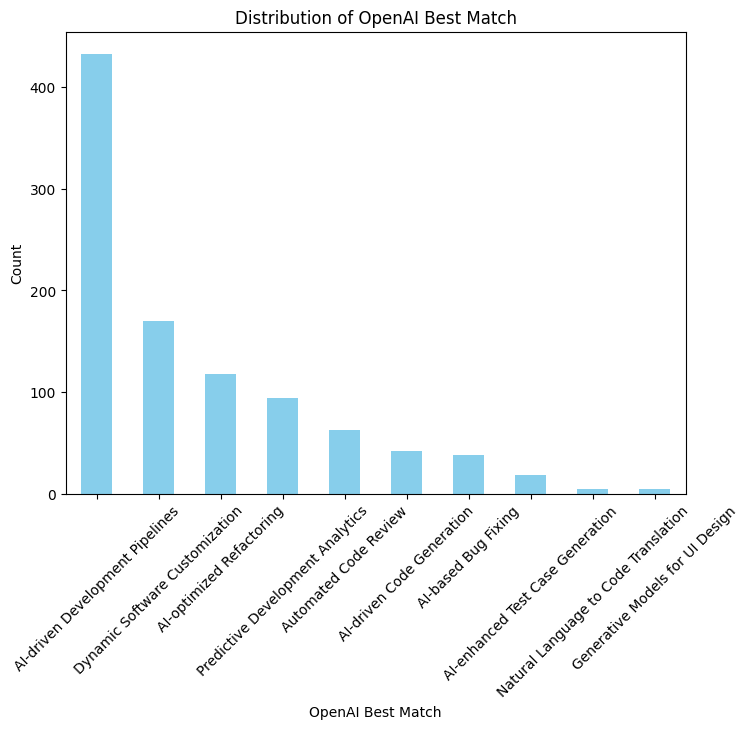

In [136]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame containing the 'OpenAI_Best_Match' column

# 1. Value Counts
value_counts = data['OpenAI_Best_Match'].value_counts()
print("Value Counts:")
print(value_counts)
print()

# 2. Descriptive Statistics
statistics = data['OpenAI_Best_Match'].describe()
print("Descriptive Statistics:")
print(statistics)
print()

# 3. Plotting (Histogram)
plt.figure(figsize=(8, 6))
data['OpenAI_Best_Match'].value_counts().plot(kind='bar', color='skyblue')
plt.title('Distribution of OpenAI Best Match')
plt.xlabel('OpenAI Best Match')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()


In [141]:
import pandas as pd

# Assuming 'data' is your DataFrame

# Group by 'OpenAI_Best_Match' and calculate mean similarity for each group
mean_similarity = data.groupby('OpenAI_Best_Match')['OpenAI_Best_Match_Similarity'].mean()

# Print the mean similarity for each 'OpenAI_Best_Match' value
print("Mean similarity for each OpenAI_Best_Match value:")
print(mean_similarity)
print()

# Alternatively, you can also calculate other summary statistics like median, min, max, etc.
median_similarity = data.groupby('OpenAI_Best_Match')['OpenAI_Best_Match_Similarity'].median()
min_similarity = data.groupby('OpenAI_Best_Match')['OpenAI_Best_Match_Similarity'].min()
max_similarity = data.groupby('OpenAI_Best_Match')['OpenAI_Best_Match_Similarity'].max()

# # Print other summary statistics
# print("Median similarity for each OpenAI_Best_Match value:")
# print(median_similarity)
# print()

# print("Minimum similarity for each OpenAI_Best_Match value:")
# print(min_similarity)
# print()

print("Maximum similarity for each OpenAI_Best_Match value:")
print(max_similarity)
print()


Mean similarity for each OpenAI_Best_Match value:
OpenAI_Best_Match
AI-based Bug Fixing                     0.254795
AI-driven Code Generation               0.331493
AI-driven Development Pipelines         0.263901
AI-enhanced Test Case Generation        0.199256
AI-optimized Refactoring                0.199975
Automated Code Review                   0.227331
Dynamic Software Customization          0.237855
Generative Models for UI Design         0.238054
Natural Language to Code Translation    0.096282
Predictive Development Analytics        0.229453
Name: OpenAI_Best_Match_Similarity, dtype: float64

Maximum similarity for each OpenAI_Best_Match value:
OpenAI_Best_Match
AI-based Bug Fixing                     0.376713
AI-driven Code Generation               0.496524
AI-driven Development Pipelines         0.477108
AI-enhanced Test Case Generation        0.284180
AI-optimized Refactoring                0.398099
Automated Code Review                   0.351744
Dynamic Software Customiz

In [147]:
# Assuming 'data' is your DataFrame

# Group by 'OpenAI_Best_Match' and find the row with the maximum similarity for each group
max_similarity_rows = data.loc[data.groupby('OpenAI_Best_Match')['OpenAI_Best_Match_Similarity'].idxmax()]

# Iterate over each row to print the maximum similarity for each 'OpenAI_Best_Match' value with its corresponding 'Post_text'
for index, row in max_similarity_rows.iterrows():
    print("OpenAI_Best_Match:", row['OpenAI_Best_Match'])
    print("Post_text:")
    print(row['Post_text'])
    print()


OpenAI_Best_Match: AI-based Bug Fixing
Post_text:
#outcomes matter in #ai size doesn’t

OpenAI_Best_Match: AI-driven Code Generation
Post_text:
A good blog by Ihab Tarazi on Code assisting LLM,  Code Llama, that has been tested and verified on  Dell Validated Design for inferencing and model customization, in partnership with Meta.   Code LLMs are ideal for code generation in specific languages, like Python, to improve developer productivity. The blog has featured some interesting developer use cases like Code Completion, and instruction-based code generation. And there are far more interesting use cases that engineering teams are exploring.

#iwork4dell

OpenAI_Best_Match: AI-driven Development Pipelines
Post_text:
Building the Infrastructure ready for AI in co-partnership with Microsoft

OpenAI_Best_Match: AI-enhanced Test Case Generation
Post_text:
"Exciting News for Contact Center Professionals! 🚀

Aragon Research has just released their 'Intelligent Contact Center 2024' report, na

In [120]:
data_325 = data[data["Threshold : 0.325"] == True].reset_index(drop=True)
data_325

KeyError: 'Threshold : 0.325'

Value Counts:
OpenAI_Best_Match
AI-driven Development Pipelines     83
AI-driven Code Generation           27
AI-based Bug Fixing                 12
Predictive Development Analytics     7
Automated Code Review                4
AI-optimized Refactoring             4
Generative Models for UI Design      2
Dynamic Software Customization       1
Name: count, dtype: int64

Descriptive Statistics:
count                                 140
unique                                  8
top       AI-driven Development Pipelines
freq                                   83
Name: OpenAI_Best_Match, dtype: object



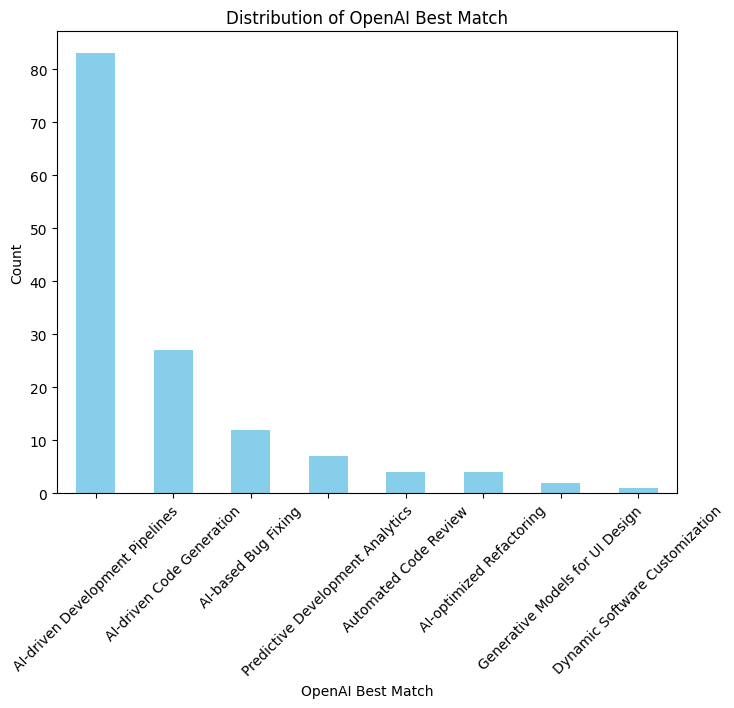

In [138]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame containing the 'OpenAI_Best_Match' column

# 1. Value Counts
value_counts = data_325['OpenAI_Best_Match'].value_counts()
print("Value Counts:")
print(value_counts)
print()

# 2. Descriptive Statistics
statistics = data_325['OpenAI_Best_Match'].describe()
print("Descriptive Statistics:")
print(statistics)
print()

# 3. Plotting (Histogram)
plt.figure(figsize=(8, 6))
data_325['OpenAI_Best_Match'].value_counts().plot(kind='bar', color='skyblue')
plt.title('Distribution of OpenAI Best Match')
plt.xlabel('OpenAI Best Match')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()


In [159]:
k = 0
print(data_325['OpenAI_Best_Match'][k])
print(data_325["Post_text"][k])
print(data_325["OpenAI_Best_Match_Similarity"][k])

AI-driven Development Pipelines
My team of world-class engineers is hiring a remote role in the US. If you have a background in development, know about Azure PaaS services, Azure Container technologies, Azure load balancers, know how to perform cloud architecture reviews, and are proficient in English, Spanish, and ideally in Portuguese, please consider applying.

#Azure #AzureFastTrack
0.3582197795594535


In [170]:
import re

def remove_words(text):
    # Define the words to remove
    words_to_remove = ["microsoft", "azure", "saas", "cloud", "architecture"]

    # Create a regular expression pattern to match any form of the words
    pattern = r'\b(?:' + '|'.join(map(re.escape, words_to_remove)) + r')\b'

    # Replace occurrences of the words with an empty string
    cleaned_text = re.sub(pattern, '', text, flags=re.IGNORECASE)

    return cleaned_text

# Example usage:
text = "This is a Microsoft Azure service for #SaaS solutions."
cleaned_text = remove_words(text)
print(cleaned_text)


This is a   service for # solutions.


In [171]:
def similarity_with_key_phrases(text1, key_phrases_embeddings):
    openai_1 = [get_embedding(text1, model="text-embedding-3-small")]
    similarities_openai = {}

    for k in range(len(key_phrases)):
        similarities_openai[key_phrases[k]] = cosine_similarity(openai_1, [key_phrases_embeddings[k]])[0][0]

    max_key = max(similarities_openai, key=similarities_openai.get)
    max_value = similarities_openai[max_key]

    print(f"Key : {max_key}")
    print(text1)
    print(f"Score : {max_value}")

In [172]:
similarity_with_key_phrases(remove_words(data_325['Post_text'][0]), key_phrases_embeddings)

Key : AI-driven Development Pipelines
My team of world-class engineers is hiring a remote role in the US. If you have a background in development, know about  PaaS services,  Container technologies,  load balancers, know how to perform   reviews, and are proficient in English, Spanish, and ideally in Portuguese, please consider applying.

# #AzureFastTrack
Score : 0.37612525806324737


In [180]:
data = pd.read_csv("profile_post_similar_7.csv")
data

,LinkedIn_url,Post_text,Glove_Similarities,Word2Vec_Similarities,Bert_Similarities,OpenAI_Similarities,OpenAI_Best_Match,OpenAI_Best_Match_Similarity,Threshold : 0.2,Threshold : 0.225,Threshold : 0.25,Threshold : 0.275,Threshold : 0.3,Threshold : 0.325,Bert_Best_Match,Bert_Best_Match_Similarity
0,http://www.linkedin.com/in/sofia-pacifico-6ba5...,I’m happy to share that I’ve obtained a new ce...,"{'AI-driven Code Generation': 0, 'Automated Co...","{'AI-driven Code Generation': 0.28857827, 'Aut...",{'AI-driven Code Generation': 0.79109370708465...,{'AI-driven Code Generation': 0.08124560534691...,Predictive Development Analytics,0.150225,False,False,False,False,False,False,Natural Language to Code Translation,0.821019
1,http://www.linkedin.com/in/sofia-pacifico-6ba5...,I am thrilled to announce that I will be joini...,"{'AI-driven Code Generation': 0, 'Automated Co...","{'AI-driven Code Generation': 0.20768699, 'Aut...",{'AI-driven Code Generation': 0.66976511478424...,{'AI-driven Code Generation': 0.07756372812769...,Predictive Development Analytics,0.188517,False,False,False,False,False,False,AI-enhanced Test Case Generation,0.684242
2,http://www.linkedin.com/in/sofia-pacifico-6ba5...,Estoy emocionada de compartir que seré una de ...,"{'AI-driven Code Generation': 0, 'Automated Co...","{'AI-driven Code Generation': 0.13611442, 'Aut...",{'AI-driven Code Generation': 0.68347299098968...,{'AI-driven Code Generation': 0.12116106687265...,AI-driven Development Pipelines,0.175292,False,False,False,False,False,False,Natural Language to Code Translation,0.728926
3,http://www.linkedin.com/in/sofia-pacifico-6ba5...,Do you wish to expand your professional networ...,"{'AI-driven Code Generation': 0, 'Automated Co...","{'AI-driven Code Generation': 0.113601044, 'Au...",{'AI-driven Code Generation': 0.78650254011154...,{'AI-driven Code Generation': 0.18334330174710...,AI-driven Development Pipelines,0.259740,True,True,True,False,False,False,AI-enhanced Test Case Generation,0.808587
4,http://www.linkedin.com/in/sofia-pacifico-6ba5...,I am happy to announce that I have officially ...,"{'AI-driven Code Generation': 0, 'Automated Co...","{'AI-driven Code Generation': 0.18561783, 'Aut...",{'AI-driven Code Generation': 0.78358221054077...,{'AI-driven Code Generation': 0.08440019976282...,AI-optimized Refactoring,0.154180,False,False,False,False,False,False,Generative Models for UI Design,0.807436
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
981,http://www.linkedin.com/in/pulkits03,"Here in Dell Technologies Global Alliances, we...","{'AI-driven Code Generation': 0, 'Automated Co...","{'AI-driven Code Generation': 0.1868945, 'Auto...",{'AI-driven Code Generation': 0.68434178829193...,{'AI-driven Code Generation': 0.14558072865258...,AI-driven Development Pipelines,0.247264,True,True,False,False,False,False,AI-enhanced Test Case Generation,0.715859
982,http://www.linkedin.com/in/pulkits03,Dell technologies Global Alliances Heroes part...,"{'AI-driven Code Generation': 0, 'Automated Co...","{'AI-driven Code Generation': 0.26776534, 'Aut...",{'AI-driven Code Generation': 0.75137186050415...,{'AI-driven Code Generation': 0.12071473791775...,Dynamic Software Customization,0.228527,True,True,False,False,False,False,AI-enhanced Test Case Generation,0.770136
983,http://www.linkedin.com/in/pulkits03,"""Now Is the Time To Be A Global Alliances Part...","{'AI-driven Code Generation': 0, 'Automated Co...","{'AI-driven Code Generation': 0.28421926, 'Aut...",{'AI-driven Code Generation': 0.69131219387054...,{'AI-driven Code Generation': 0.12197071995437...,Dynamic Software Customization,0.231618,True,True,False,False,False,False,AI-enhanced Test Case Generation,0.708295
984,http://www.linkedin.com/in/pulkits03,"Did you know? Last fall, Dell Boomi added 20 t...","{'AI-driven Code Generation': 0, 'Automated Co...","{'AI-driven Code Generation': 0.20183983, 'Aut...",{'AI-driven Code Generation': 0.79895925521850...,{'AI-driven Code Generatio

In [193]:
df = data[data["Bert_Best_Match_Similarity"] >= 0.75]
len(df)

776

In [188]:
thresholds_bert = [0.75, 0.775, 0.8, 0.825, 0.85]

In [189]:
for threshold in thresholds_bert:
    sample_list = []
    for i in range(len(data)):
        sample_list.append(None)
    attribute_name = f"Threshold_Bert : {threshold}"
    data[attribute_name] = sample_list
    for i in range(len(data)):
        if data["Bert_Best_Match_Similarity"][i] >= threshold:
            data[attribute_name][i] = True
        else:
            data[attribute_name][i] = False

/var/folders/67/bhjq37955y5_sr34fd9gznsm0000gn/T/ipykernel_3952/1130321866.py:9: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  data[attribute_name][i] = True
/var/folders/67/bhjq37955y5_sr34fd9gznsm0000gn/T/ipykernel_3952/1130321866.py:9: Se

In [205]:
data.to_csv("profile_post_similar_8.csv", index=False)

In [198]:
data_85 = data[data["Threshold_Bert : 0.85"] == True].reset_index(drop=True)

In [203]:
k = 2
print(data_85['Bert_Best_Match'][k])
print(data_85["Post_text"][k])
print(data_85["Bert_Best_Match_Similarity"][k])

AI-enhanced Test Case Generation
Planning a mass scale IoT rollout? Consider IPv6 based technology...
0.8639973998069763
